In [1]:
import pandas as pd 
import numpy as np
import plotly.express as px 
import plotly.graph_objects as go
# from plotly.subplots import make_subplots

In [30]:
df=pd.read_csv("finalRealEstate.csv")

In [64]:
df23=df[df['year']==2023]
df24=df[df['year']==2024]

In [65]:
df24

,rent,beds,baths,type,area_in_sqft,rent_per_sqft,rent_category,furnishing,posted_date,age_of_listing_in_days,city,season,year,month
0,124000,3,4,Apartment,1785,69.467787,Medium,Unfurnished,2024-03-07,45,Abu Dhabi,Spring,2024,3
1,140000,3,4,Apartment,1422,98.452883,Medium,Unfurnished,2024-03-08,44,Abu Dhabi,Spring,2024,3
2,99000,2,3,Apartment,1314,75.342466,Medium,Furnished,2024-03-21,31,Abu Dhabi,Spring,2024,3
4,65000,1,1,Apartment,698,93.123209,Low,Unfurnished,2024-03-11,41,Abu Dhabi,Spring,2024,3
5,75000,1,2,Apartment,886,84.650113,Medium,Unfurnished,2024-04-05,16,Abu Dhabi,Spring,2024,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48985,335000,2,2,Apartment,1395,240.143369,High,Furnished,2024-01-16,96,Dubai,Winter,2024,1
48986,94999,1,2,Apartment,670,141.789552,Medium,Furnished,2024-01-15,97,Dubai,Winter,2024,1
48987,99500,1,2,Apartment,1000,99.500000,Medium,Furnished,2024-01-13,99,Dubai,Winter,2024,1
48988,230000,3,4,Apartment,1984,115.927419,High,Unfurnished,2024-01-12,100,Dubai,Winter,2024,1


In [66]:
df23.reset_index(drop=True, inplace=True)
df24.reset_index(drop=True, inplace=True)

## 2024

In [67]:
x=df24.groupby(['city','type','furnishing'])[['rent_per_sqft']].mean()

In [68]:
xd=pd.DataFrame(x)
xd

rent_per_sqft
city      type      furnishing                
Abu Dhabi Apartment Furnished        97.886314
                    Unfurnished      60.805296
          Villa     Furnished        51.817123
                    Unfurnished      37.337080
Dubai     Apartment Furnished       150.584824
                    Unfurnished     118.355664
          Villa     Furnished        82.484576
                    Unfurnished      73.474519

In [69]:
month=df24.groupby(['month'])['rent'].sum()

In [70]:
avg=df24.groupby(['month'])['age_of_listing_in_days'].mean()
pd.DataFrame(avg )

,age_of_listing_in_days
month,
1,94.615105
2,64.216441
3,34.586381
4,16.913429


In [71]:
monthdf=pd.DataFrame(month)
monthdf

,rent
month,
1,761140899
2,1211768173
3,2123180084
4,722039443


In [72]:
pd.DataFrame(df24.groupby(['month'])['rent'].count())

,rent
month,
1,5773
2,9379
3,17990
4,6203


In [73]:
px.line(monthdf,y='rent',title='rent in 2024')

In [74]:
fig = go.Figure(data=[go.Pie(labels=df24['season'], hole=0.3) ])
fig.update_layout(
    title='Season in 2024'
    )
fig.show()

In [75]:
px.pie(df24 , names='type' ,title='Type in 2024')



In [76]:
pd.DataFrame(df24.groupby(['month'])['rent'].count())

,rent
month,
1,5773
2,9379
3,17990
4,6203


In [77]:
px.histogram(df24,x='beds',color="baths"  ,title ='Bed & bath rooms for 2024').update_yaxes(categoryorder='total descending')

In [78]:
px.histogram(df24,x='beds',color="baths" ,y='rent',title ='rent according to Bed & bath rooms for 2024' ).update_yaxes(categoryorder='total descending')

In [79]:
px.histogram(df24,x='city' , y='rent_per_sqft' ,color='type' ,barmode='group' ,title='rent per sqft accoriding to both city and type 2024').update_xaxes(categoryorder='total descending')


In [80]:
px.histogram(df24,x='city' , y='rent' ,color='type' ,barmode='group' ,title='rent accoriding to both city and type 2024').update_xaxes(categoryorder='total descending')

## 2023

In [81]:
df23

,rent,beds,baths,type,area_in_sqft,rent_per_sqft,rent_category,furnishing,posted_date,age_of_listing_in_days,city,season,year,month
0,75000,1,1,Apartment,706,106.232295,Medium,Furnished,2023-12-12,131,Abu Dhabi,Winter,2023,12
1,110000,2,2,Apartment,1356,81.120944,Medium,Unfurnished,2023-01-29,448,Abu Dhabi,Winter,2023,1
2,125000,3,4,Apartment,1744,71.674312,Medium,Unfurnished,2023-12-01,142,Abu Dhabi,Winter,2023,12
3,95000,3,3,Apartment,1689,56.246300,Medium,Unfurnished,2023-01-29,448,Abu Dhabi,Winter,2023,1
4,85000,3,3,Apartment,1819,46.728972,Medium,Unfurnished,2023-01-29,448,Abu Dhabi,Winter,2023,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9649,230000,2,2,Apartment,1096,209.854015,High,Unfurnished,2023-12-13,130,Dubai,Winter,2023,12
9650,44999,0,1,Apartment,316,142.401899,Low,Unfurnished,2023-12-01,142,Dubai,Winter,2023,12
9651,95000,1,2,Apartment,731,129.958960,Medium,Unfurnished,2023-11-28,145,Dubai,Fall,2023,11
9652,65000,2,2,Apartment,1200,54.166667,Low,Unfurnished,2023-10-27,177,Dubai,Fall,2023,10


In [82]:
x=df23.groupby(['city','type','furnishing'])[['rent_per_sqft']].mean()
x

rent_per_sqft
city      type      furnishing                
Abu Dhabi Apartment Furnished        90.090465
                    Unfurnished      60.274848
          Villa     Furnished        86.921686
                    Unfurnished      38.956043
Dubai     Apartment Furnished       163.982408
                    Unfurnished     121.870364
          Villa     Furnished        70.481617
                    Unfurnished      72.320169

In [83]:
month=df23.groupby(['month'])['rent'].sum()
month

month
1       4032499
2       2566497
3       7317648
4       3400994
5       9645686
6      15275447
7      30447214
8      50356602
9     104156911
10    239669361
11    312632777
12    398341443
Name: rent, dtype: int64

In [84]:
avg=df23.groupby(['month'])['age_of_listing_in_days'].mean()
pd.DataFrame(avg)

,age_of_listing_in_days
month,
1,457.914894
2,431.833333
3,401.000000
4,369.068966
5,340.824742
6,311.807453
7,277.256494
8,248.934307
9,217.861502


In [85]:
monthdf=pd.DataFrame(month)
monthdf

,rent
month,
1,4032499
2,2566497
3,7317648
4,3400994
5,9645686
6,15275447
7,30447214
8,50356602
9,104156911


In [86]:
pd.DataFrame(df23.groupby(['month'])['rent'].count())

,rent
month,
1,47
2,24
3,70
4,29
5,97
6,161
7,308
8,411
9,852


In [87]:
px.line(monthdf,y='rent',title='rent in 2023')

In [88]:
fig = go.Figure(data=[go.Pie(labels=df23['season'], hole=0.3)])
fig.update_layout(
    title='Season in 2023'
    )
fig.show()

In [89]:
px.pie(df23 , names='type' ,title='type for 2023')

In [90]:
px.histogram(df23,x='beds',color="baths"   ,title ='Bed & bath rooms for 2023').update_yaxes(categoryorder='total descending')

In [91]:
px.histogram(df23,x='beds',color="baths" ,y='rent' ,title ='Rent according to Bed & bath rooms for 2023').update_yaxes(categoryorder='total descending')

In [92]:
px.histogram(df23,x='city' , y='rent_per_sqft' ,color='type' ,barmode='group' ,title='rent per sqft accoriding to both city and type 2023').update_xaxes(categoryorder='total descending')


In [93]:
px.histogram(df23,x='city' , y='rent' ,color='type' ,barmode='group' ,title='rent accoriding to both city and type 2023').update_xaxes(categoryorder='total descending')


In [94]:
fig = px.scatter(df23, x="rent", y="season",
         size="area_in_sqft", color="type",
         hover_name="city", size_max=60)
fig.show()

In [95]:
%%writefile realestate.py
import pandas as  pd
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import streamlit as st
# read date
df=pd.read_csv('finalRealEstate.csv')

# sidbar title
st.sidebar.title("Explore car's market")

def RealEstatMarket():
    st.markdown("<h2 style='color:#31356E; text-algin:center'>Real Estate Market in Dubai</h2>" ,unsafe_allow_html=True)
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>building properties</h5>" ,unsafe_allow_html=True)
    col1 , col2 = st.columns([3, 3])
    with col1:
        st.plotly_chart(px.histogram(df,x='beds',color_discrete_sequence=['#2D8BBA']).update_layout(
            title='Number of beds',
            bargap=0.1,
            autosize=False,
            width=350,
            height=500))
    with col2:
        st.plotly_chart(px.histogram(df,x='baths',color_discrete_sequence=['#2D8BBA']).update_layout(
        title='Number of baths',bargap=0.1,width=350 , height=500    ))
        
#     fig = go.Figure(data=[go.Pie(labels=df['type'],pull=[0.2, 0, 0, 0,0,0])])
    
        
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Types of the buildings</h5>" ,unsafe_allow_html=True)
    fig1 = go.Figure(data=[go.Pie(labels=df['type'],pull=[0.2, 0, 0, 0,0,0])])
    st.plotly_chart(fig1)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>building city</h5>" ,unsafe_allow_html=True)
    st.plotly_chart(px.pie(df,names='city',color_discrete_sequence=['#2D8BBA']))
    st.plotly_chart(px.scatter(df,x='city' ,y='rent',color_discrete_sequence=['#2D8BBA']))
    
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>years benfits</h5>" ,unsafe_allow_html=True)
    st.plotly_chart(px.line(pd.DataFrame(df.groupby(['year'])['rent'].sum()),y='rent' ,title='Sum of rent per Year'))
    
def market24():
    msk=df['type'].isin(['Apartment','Villa'])
    msk2=df['year']==2024
    msk3=df['city'].isin(['Abu Dhabi','Dubai'])
    df24=df[msk& msk2&msk3]
    st.markdown("<h2 style='color:#31356E; text-algin:center'>Real Estate Market at 2024 in Emarites</h2>" ,unsafe_allow_html=True)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>properties of the building</h5>" ,unsafe_allow_html=True)
    st.plotly_chart(px.histogram(df[msk& msk2&msk3],x='beds',color="baths",title ='rent according to Bed & bath rooms for 2024' ).update_yaxes(categoryorder='total descending'))
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Furnishing</h5>" ,unsafe_allow_html=True)
    st.plotly_chart(px.pie(df[msk& msk2&msk3],names='furnishing'))
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>working with Apartment and villa</h5>" ,unsafe_allow_html=True)
    fig3 = go.Figure(data=[go.Pie(labels=df24['type'],pull=[0.2, 0, 0, 0,0,0])])
    st.plotly_chart(fig3)
    
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Season where the build is posted</h5>" ,unsafe_allow_html=True)    
    fig = go.Figure(data=[go.Pie(labels=df24['season'], hole=0.3) ])
    fig.update_layout(title='Season in 2024')
    st.plotly_chart(fig)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Rent related to the features</h5>" ,unsafe_allow_html=True)      
    st.plotly_chart(px.histogram(df24,x='city' , y='rent' ,color='type' ,barmode='group' ,title='rent accoriding to both city and type 2024').update_xaxes(categoryorder='total descending'))
    st.plotly_chart(px.histogram(df24,x='beds' , y='rent' ,color="baths",title ='rent according to Bed & bath rooms for 2024' ).update_yaxes(categoryorder='total descending'))
    

    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>each month benfit</h5>" ,unsafe_allow_html=True) 
    month=df[msk& msk2&msk3].groupby(['month'])['rent'].sum()
    monthdf=pd.DataFrame(month)
    st.plotly_chart(px.line(monthdf,y='rent',title='rent in 2024'))
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Average rent for every sqft related to city</h5>" ,unsafe_allow_html=True) 
    st.image("avg2024.png", caption='Average rent for every sqft', use_column_width=True)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Average listing days for each month</h5>" ,unsafe_allow_html=True) 
    st.image("avglisting2024.png", caption='Average of listing days', use_column_width=True)

def market23():
    msk=df['type'].isin(['Apartment','Villa'])
    msk2=df['year']==2023
    msk3=df['city'].isin(['Abu Dhabi','Dubai'])
    df24=df[msk& msk2&msk3]
    st.markdown("<h2 style='color:#31356E; text-algin:center'>Real Estate Market at 2023 in Emarites</h2>" ,unsafe_allow_html=True)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>properties of the building</h5>" ,unsafe_allow_html=True)
    st.plotly_chart(px.histogram(df[msk& msk2&msk3],x='beds',color="baths",title ='rent according to Bed & bath rooms for 2023' ).update_yaxes(categoryorder='total descending'))
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Furnishing</h5>" ,unsafe_allow_html=True)
    st.plotly_chart(px.pie(df[msk& msk2&msk3],names='furnishing'))
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>working with Apartment and villa</h5>" ,unsafe_allow_html=True)
    fig3 = go.Figure(data=[go.Pie(labels=df24['type'],pull=[0.2, 0, 0, 0,0,0])])
    st.plotly_chart(fig3)
    
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Season where the build is posted</h5>" ,unsafe_allow_html=True)    
    fig = go.Figure(data=[go.Pie(labels=df24['season'], hole=0.3) ])
    fig.update_layout(title='Season in 2024')
    st.plotly_chart(fig)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Rent related to the features</h5>" ,unsafe_allow_html=True)      
    st.plotly_chart(px.histogram(df24,x='city' , y='rent' ,color='type' ,barmode='group' ,title='rent accoriding to both city and type 2023').update_xaxes(categoryorder='total descending'))
    st.plotly_chart(px.histogram(df24,x='beds' , y='rent' ,color="baths",title ='rent according to Bed & bath rooms for 2023' ).update_yaxes(categoryorder='total descending'))
    

    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>each month benfit</h5>" ,unsafe_allow_html=True) 
    month=df[msk& msk2&msk3].groupby(['month'])['rent'].sum()
    monthdf=pd.DataFrame(month)
    st.plotly_chart(px.line(monthdf,y='rent',title='rent in 2023'))
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Average rent for every sqft related to city</h5>" ,unsafe_allow_html=True) 
    st.image("avg2023.png", caption='Average rent for every sqft', use_column_width=True)
    
    st.markdown("<h5 style='color:#2D8BBA;text-algin:left'>Average listing days for each month</h5>" ,unsafe_allow_html=True) 
    st.image("avglisting2023.png", caption='Average of listing days', use_column_width=True)


pages = {
    'All Markets' : RealEstatMarket,
    'realstat in Emirats for year 2024' : market24,
    'realstat in Emirats for year 2023' : market23,
#     'USA' : USA
}

pg = st.sidebar.radio('Navigate Pages' , pages.keys())


pages[pg]()

Writing realestate.py


In [189]:
!streamlit run realestate.py

^C


# the data preprocessing

In [96]:
df

,rent,beds,baths,type,area_in_sqft,rent_per_sqft,rent_category,furnishing,posted_date,age_of_listing_in_days,city,season,year,month
0,124000,3,4,Apartment,1785,69.467787,Medium,Unfurnished,2024-03-07,45,Abu Dhabi,Spring,2024,3
1,140000,3,4,Apartment,1422,98.452883,Medium,Unfurnished,2024-03-08,44,Abu Dhabi,Spring,2024,3
2,99000,2,3,Apartment,1314,75.342466,Medium,Furnished,2024-03-21,31,Abu Dhabi,Spring,2024,3
3,75000,1,1,Apartment,706,106.232295,Medium,Furnished,2023-12-12,131,Abu Dhabi,Winter,2023,12
4,65000,1,1,Apartment,698,93.123209,Low,Unfurnished,2024-03-11,41,Abu Dhabi,Spring,2024,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48994,230000,2,2,Apartment,1096,209.854015,High,Unfurnished,2023-12-13,130,Dubai,Winter,2023,12
48995,44999,0,1,Apartment,316,142.401899,Low,Unfurnished,2023-12-01,142,Dubai,Winter,2023,12
48996,95000,1,2,Apartment,731,129.958960,Medium,Unfurnished,2023-11-28,145,Dubai,Fall,2023,11
48997,65000,2,2,Apartment,1200,54.166667,Low,Unfurnished,2023-10-27,177,Dubai,Fall,2023,10


In [97]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48999 entries, 0 to 48998
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   rent                    48999 non-null  int64  
 1   beds                    48999 non-null  int64  
 2   baths                   48999 non-null  int64  
 3   type                    48999 non-null  object 
 4   area_in_sqft            48999 non-null  int64  
 5   rent_per_sqft           48999 non-null  float64
 6   rent_category           48999 non-null  object 
 7   furnishing              48999 non-null  object 
 8   posted_date             48999 non-null  object 
 9   age_of_listing_in_days  48999 non-null  int64  
 10  city                    48999 non-null  object 
 11  season                  48999 non-null  object 
 12  year                    48999 non-null  int64  
 13  month                   48999 non-null  int64  
dtypes: float64(1), int64(7), object(6)
mem

In [98]:
df['type'].unique()

array(['Apartment', 'Villa'], dtype=object)

<Axes: xlabel='type', ylabel='count'>

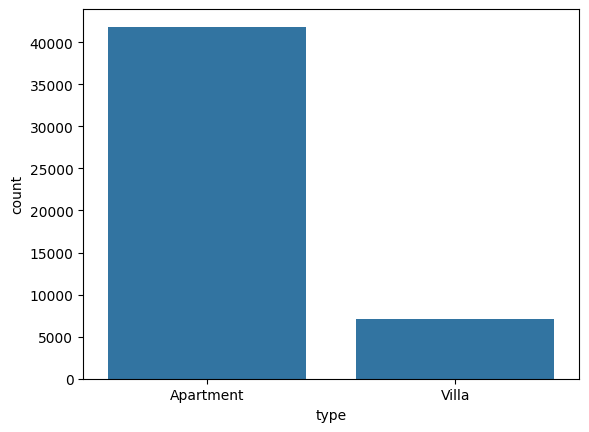

In [99]:
sns.countplot(x=df['type'])

<Axes: xlabel='city', ylabel='count'>

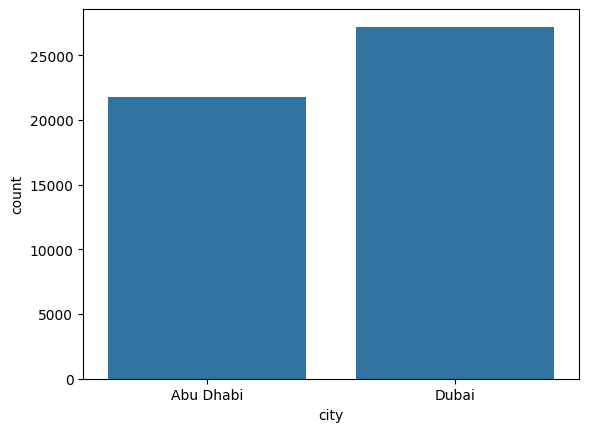

In [100]:
sns.countplot(x=df['city'])

<Axes: xlabel='season', ylabel='count'>

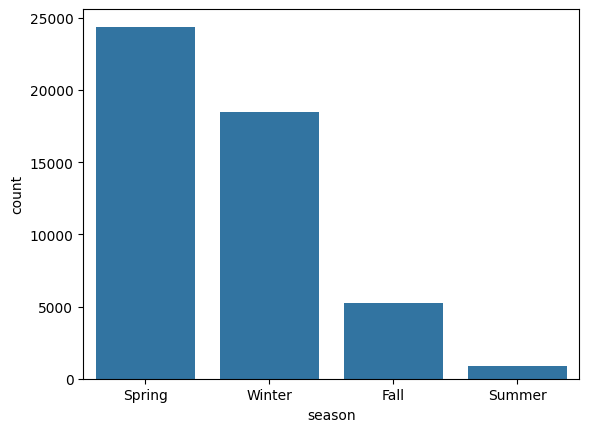

In [101]:
sns.countplot(x=df['season'])

<Axes: xlabel='year', ylabel='count'>

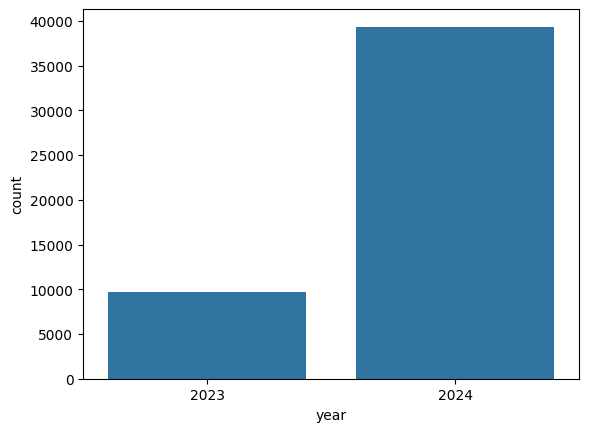

In [102]:
sns.countplot(x=df['year'])

In [103]:
df.describe()

,rent,beds,baths,area_in_sqft,rent_per_sqft,age_of_listing_in_days,year,month
count,48999.000000,48999.000000,48999.000000,48999.000000,48999.000000,48999.000000,48999.000000,48999.000000
mean,122369.266271,1.925978,2.569461,1702.852119,96.734307,72.657422,2023.802976,4.158983
std,71473.750644,1.423237,1.466800,2145.264933,55.446894,61.212513,0.397755,3.309003
min,290.000000,0.000000,1.000000,74.000000,0.232000,11.000000,2023.000000,1.000000
25%,65000.000000,1.000000,2.000000,786.000000,55.000000,30.000000,2024.000000,2.000000
50%,105000.000000,2.000000,2.000000,1200.000000,85.669782,52.000000,2024.000000,3.000000
75%,164995.000000,3.000000,3.000000,1800.000000,128.926025,95.000000,2024.000000,4.000000
max,340000.000000,11.000000,11.000000,168046.000000,1827.956989,467.000000,2024.000000,12.000000


<Axes: xlabel='rent', ylabel='Density'>

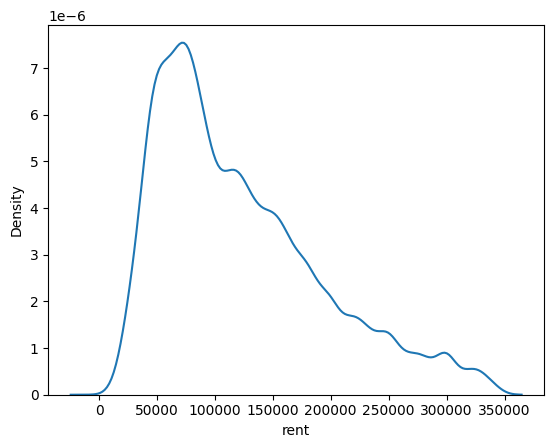

In [104]:
sns.kdeplot(df['rent'])

<Axes: ylabel='beds'>

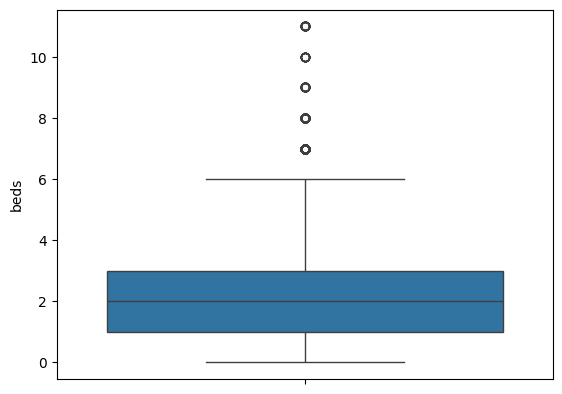

In [105]:
sns.boxplot(df['beds'])

In [106]:
df['beds'] = df['beds'].apply(lambda x: np.nan if x > 6 else x)


<Axes: ylabel='baths'>

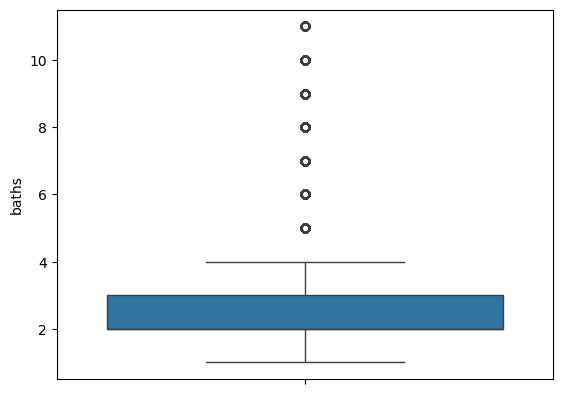

In [107]:
sns.boxplot(df['baths'])

In [108]:
df['baths'] = df['baths'].apply(lambda x: np.nan if x > 5 else x)


<Axes: ylabel='area_in_sqft'>

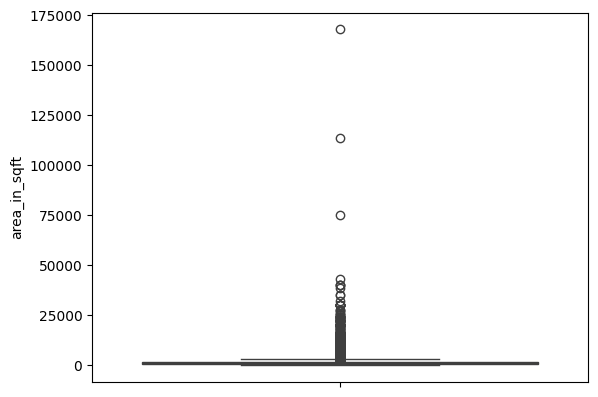

In [109]:
sns.boxplot(df['area_in_sqft'])

<Axes: ylabel='rent_per_sqft'>

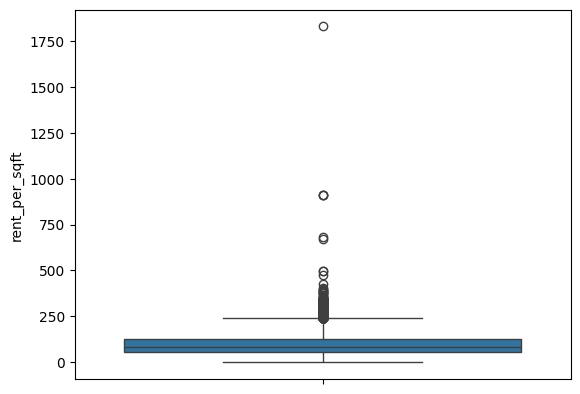

In [110]:
sns.boxplot(df['rent_per_sqft'])

<Axes: ylabel='age_of_listing_in_days'>

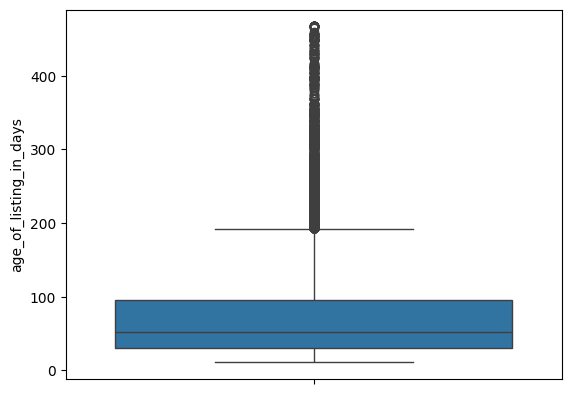

In [111]:
sns.boxplot(df['age_of_listing_in_days'])

In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48999 entries, 0 to 48998
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   rent                    48999 non-null  int64  
 1   beds                    48580 non-null  float64
 2   baths                   46285 non-null  float64
 3   type                    48999 non-null  object 
 4   area_in_sqft            48999 non-null  int64  
 5   rent_per_sqft           48999 non-null  float64
 6   rent_category           48999 non-null  object 
 7   furnishing              48999 non-null  object 
 8   posted_date             48999 non-null  object 
 9   age_of_listing_in_days  48999 non-null  int64  
 10  city                    48999 non-null  object 
 11  season                  48999 non-null  object 
 12  year                    48999 non-null  int64  
 13  month                   48999 non-null  int64  
dtypes: float64(3), int64(5), object(6)
mem

In [113]:
df["type"].unique()

array(['Apartment', 'Villa'], dtype=object)

In [114]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()


In [115]:
df['type_encoded'] = label_encoder.fit_transform(df['type'])


In [116]:
df['city_encoded'] = label_encoder.fit_transform(df['city'])

In [117]:
df['furnishing_encoded'] = label_encoder.fit_transform(df['furnishing'])

In [118]:
df['season_encoded'] = label_encoder.fit_transform(df['season'])

In [119]:
df

,rent,beds,baths,type,area_in_sqft,rent_per_sqft,rent_category,furnishing,posted_date,age_of_listing_in_days,city,season,year,month,type_encoded,city_encoded,furnishing_encoded,season_encoded
0,124000,3.0,4.0,Apartment,1785,69.467787,Medium,Unfurnished,2024-03-07,45,Abu Dhabi,Spring,2024,3,0,0,1,1
1,140000,3.0,4.0,Apartment,1422,98.452883,Medium,Unfurnished,2024-03-08,44,Abu Dhabi,Spring,2024,3,0,0,1,1
2,99000,2.0,3.0,Apartment,1314,75.342466,Medium,Furnished,2024-03-21,31,Abu Dhabi,Spring,2024,3,0,0,0,1
3,75000,1.0,1.0,Apartment,706,106.232295,Medium,Furnished,2023-12-12,131,Abu Dhabi,Winter,2023,12,0,0,0,3
4,65000,1.0,1.0,Apartment,698,93.123209,Low,Unfurnished,2024-03-11,41,Abu Dhabi,Spring,2024,3,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48994,230000,2.0,2.0,Apartment,1096,209.854015,High,Unfurnished,2023-12-13,130,Dubai,Winter,2023,12,0,1,1,3
48995,44999,0.0,1.0,Apartment,316,142.401899,Low,Unfurnished,2023-12-01,142,Dubai,Winter,2023,12,0,1,1,3
48996,95000,1.0,2.0,Apartment,731,129.958960,Medium,Unfurnished,2023-11-28,145,Dubai,Fall,2023,11,0,1,1,0
48997,65000,2.0,2.0,Apartment,1200,54.166667,Low,Unfurnished,2023-10-27,177,Dubai,Fall,2023,10,0,1,1,0
